<a href="https://colab.research.google.com/github/Krahjotdaan/MachineLearning/blob/main/ML_tricks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Установим библиотеки

In [ ]:
!pip install pandas-profiling
!pip install pycaret
!pip install optuna

# Pandas Profiling

In [ ]:
import pandas as pd
import ydata_profiling

In [ ]:
df = pd.read_csv('telecom_churn.csv')

In [ ]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# PyCaret

[PyCaret](https://pycaret.gitbook.io/docs/) - библиотека, которая позволяет обучить сразу несколько ML моделей

In [ ]:
from pycaret.classification import setup, compare_models, tune_model, create_model, plot_model

In [ ]:
df = df.drop(columns = ['Churn Category', 'Churn Reason', 'Customer ID', 'City']).fillna(0)

Загружаем данные

In [ ]:
exp1= setup(df, target='Customer Status')

,Description,Value
0,Session id,5319
1,Target,Customer Status
2,Target type,Multiclass
3,Target mapping,"Churned: 0, Joined: 1, Stayed: 2"
4,Original data shape,"(7043, 34)"
5,Transformed data shape,"(7043, 64)"
6,Transformed train set shape,"(4930, 64)"
7,Transformed test set shape,"(2113, 64)"
8,Numeric features,15
9,Categorical features,18


Сравниваем модели

In [ ]:
models = compare_models(fold=5, sort='f1')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8525,0.0000,0.8525,0.8475,0.8480,0.6790,0.6819,5.7340
lightgbm,Light Gradient Boosting Machine,0.8436,0.0000,0.8436,0.8392,0.8405,0.6635,0.6649,3.6180
xgboost,Extreme Gradient Boosting,0.8422,0.0000,0.8422,0.8374,0.8388,0.6598,0.6612,1.0700
rf,Random Forest Classifier,0.8351,0.0000,0.8351,0.8274,0.8284,0.6359,0.6403,1.0640
et,Extra Trees Classifier,0.8166,0.0000,0.8166,0.8069,0.8091,0.5940,0.5978,1.1840
lda,Linear Discriminant Analysis,0.7925,0.0000,0.7925,0.8001,0.7955,0.5743,0.5751,0.4160
dt,Decision Tree Classifier,0.7807,0.0000,0.7807,0.7837,0.7815,0.5423,0.5430,0.4780
ridge,Ridge Classifier,0.7921,0.0000,0.7921,0.7761,0.7698,0.5325,0.5380,0.4000
lr,Logistic Regression,0.7746,0.0000,0.7746,0.7668,0.7690,0.5149,0.5169,1.8740
nb,Naive Bayes,0.7063,0.0000,0.7063,0.7867,0.7269,0.4721,0.4937,0.4300


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

Работаем с отдельной моделью

In [ ]:
rf = create_model('rf', fold=5)
tuned_rf = tune_model(rf, fold=5, optimize='f1', n_iter=15)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8398,0.0000,0.8398,0.8312,0.8319,0.6428,0.6490
1,0.8509,0.0000,0.8509,0.8458,0.8459,0.6752,0.6789
2,0.8144,0.0000,0.8144,0.8043,0.8054,0.5847,0.5900
3,0.8458,0.0000,0.8458,0.8386,0.8398,0.6604,0.6646
4,0.8245,0.0000,0.8245,0.8172,0.8191,0.6165,0.6188
Mean,0.8351,0.0000,0.8351,0.8274,0.8284,0.6359,0.6403
Std,0.0136,0.0000,0.0136,0.0150,0.0146,0.0322,0.0321


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8408,0.0000,0.8408,0.8336,0.8348,0.6497,0.6538
1,0.8631,0.0000,0.8631,0.8595,0.8580,0.7013,0.7060
2,0.8174,0.0000,0.8174,0.8057,0.8082,0.5925,0.5979
3,0.8540,0.0000,0.8540,0.8480,0.8493,0.6810,0.6840
4,0.8357,0.0000,0.8357,0.8324,0.8336,0.6489,0.6493
Mean,0.8422,0.0000,0.8422,0.8358,0.8368,0.6547,0.6582
Std,0.0157,0.0000,0.0157,0.0181,0.0170,0.0369,0.0366


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 5 folds for each of 15 candidates, totalling 75 fits


In [ ]:
rf

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=5319, verbose=0,
                       warm_start=False)

In [ ]:
tuned_rf

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight={},
                       criterion='entropy', max_depth=11, max_features=1.0,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0005, min_samples_leaf=2,
                       min_samples_split=10, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=220, n_jobs=-1,
                       oob_score=False, random_state=5319, verbose=0,
                       warm_start=False)

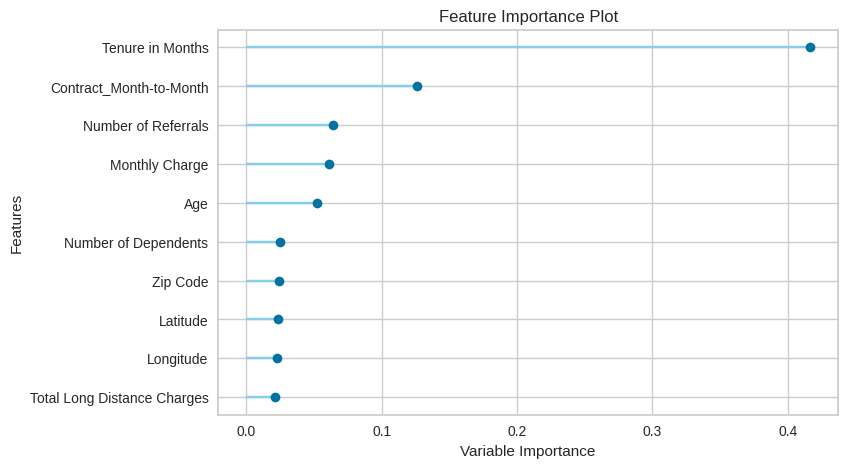

In [ ]:
plot_model(tuned_rf, plot='feature')

# Optuna

Samplers - набор алгоритмов для поиска гипперпараметров

В [optuna](https://optuna.org/) реализованы:

- GridSampler
- RandomSampler
- TPESampler
- CmaEsSampler
- PartialFixedSampler
- NSGAIISampler
- MOTPESampler
- QMCSampler

Pruner - набор алгоритмов для прореживания экспериментов(позволяет не проводить эксперимент до конца, если он с большой вероятностью будет не даст оптимальных результатов)

В optuna реализованы:

- MedianPruner
- NopPruner
- PatientPruner
- SuccessiveHalvingPruner
- HyperbandPruner
- ThreshholdPruner

Два варианта неплохих комбинаций:

- RandomSampler + MedianPruner
- TPESampler + HyperBand

In [ ]:
import optuna
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier
from sklearn.metrics import f1_score

In [ ]:
lgbm = LGBMClassifier()

y = df['Customer Status']
X = df.drop(columns = ['Customer Status'])
X = pd.get_dummies(X)

In [ ]:
def objective(trial, data=X, target=y):

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

    params = {
        'objective': 'multiclass',
        'metric': 'multi_logloss',
        'reg_alpha': trial.suggest_float('reg_alpha', 0.001, 10.0),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.001, 10.0),
        'num_leaves': trial.suggest_int('num_leaves', 11, 111),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.5),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 0.9),
        'n_estimators': trial.suggest_int('n_estimators', 75, 300),
        'n_jobs' : -1,
        'random_state': 11,
        'boosting_type': 'gbdt',
        'verbose': -1,
        #'device': 'gpu'
    }

    model = LGBMClassifier(**params)
    model.fit(X_train, y_train, eval_set=[(X_test, y_test)], eval_metric='multi_logloss')
    pred = model.predict(X_test)
    f1 = f1_score(y_test, pred, average='macro')

    return f1

In [ ]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100, n_jobs = -1)

[I 2024-04-07 11:26:23,755] A new study created in memory with name: no-name-68befdad-c0cc-4e2a-9ff1-d2208f6ad2c5
[I 2024-04-07 11:26:26,074] Trial 1 finished with value: 0.7645234233707238 and parameters: {'reg_alpha': 6.330356588997356, 'reg_lambda': 5.772121425230578, 'num_leaves': 31, 'min_child_samples': 38, 'max_depth': 10, 'learning_rate': 0.45769948239959674, 'colsample_bytree': 0.5608867476245484, 'n_estimators': 178}. Best is trial 1 with value: 0.7645234233707238.
[I 2024-04-07 11:26:29,025] Trial 2 finished with value: 0.7563104190577339 and parameters: {'reg_alpha': 4.278388720599319, 'reg_lambda': 0.5444944994918061, 'num_leaves': 97, 'min_child_samples': 49, 'max_depth': 7, 'learning_rate': 0.10170181706785261, 'colsample_bytree': 0.3095161853696864, 'n_estimators': 148}. Best is trial 1 with value: 0.7645234233707238.
[I 2024-04-07 11:26:29,051] Trial 0 finished with value: 0.7721095161825556 and parameters: {'reg_alpha': 7.194537136077699, 'reg_lambda': 1.6434408654711

Визуализируем

In [ ]:
optuna.visualization.plot_optimization_history(study)

In [ ]:
study.best_params, study.best_trial.value

({'reg_alpha': 6.859497524235158,
  'reg_lambda': 9.490611328625809,
  'num_leaves': 78,
  'min_child_samples': 23,
  'max_depth': 7,
  'learning_rate': 0.0911687319932469,
  'colsample_bytree': 0.8823790521027519,
  'n_estimators': 120},
 0.7950677872854365)

In [ ]:
optuna.visualization.plot_param_importances(study)

# ImbLearn

Посмотрим внимательнее на наши данные

In [ ]:
import matplotlib.pyplot as plt

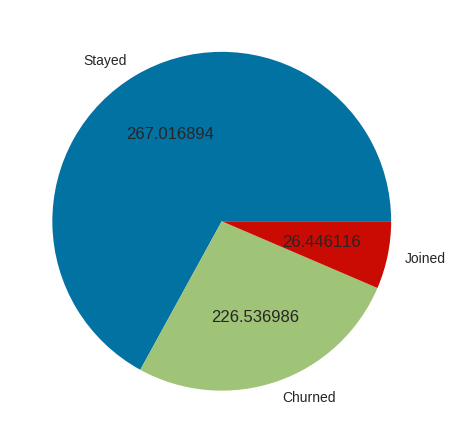

In [ ]:
vc = y.value_counts()
plt.pie(vc, labels=vc.index, autopct='2%f');

In [ ]:
import imblearn

[IMBLearn](https://imbalanced-learn.org/stable/user_guide.html#user-guide) - библиотека для борьбы с дисбалансом классов

В этой библиотеке реализовано несколько подходов:

- OverSampling
- UnderSampling
- комбинация Over и Under
- ансамбли

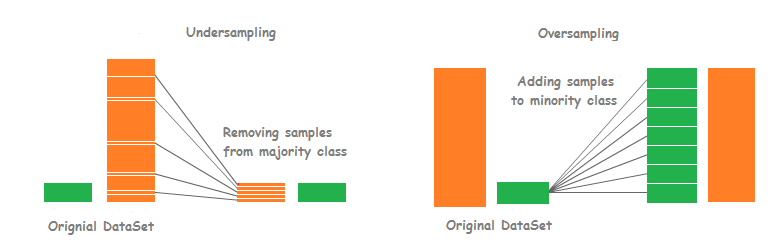

Алгоритмы UnderSampling:

- RandomUnderSampler
- CondensedNearestNeighbour
- AllKNN
- NearMiss
- ...

Алгоритмы OverSampling:

- RandomOverSampler
- SMOTE
- ADASYN
- KMeansSMOTE
- ...

Ансамбли:

- EasyEnsembleClassifier
- RUSBoostClassifier
- BalancedBaggingClassifier
- BalancedRandomForestClassifier

Базовая модель

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [ ]:
model = LGBMClassifier()
model.fit(X_train, y_train)
pred = model.predict(X_test)
f1_score(y_test, pred, average='macro')

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001265 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2483
[LightGBM] [Info] Number of data points in the train set: 4718, number of used features: 68
[LightGBM] [Info] Start training from score -1.321067
[LightGBM] [Info] Start training from score -2.799658
[LightGBM] [Info] Start training from score -0.397023
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


0.758777276466369

Первый запуск

In [ ]:
from imblearn.over_sampling import SMOTE, ADASYN

In [ ]:
X_res, y_res = SMOTE().fit_resample(X, y)

In [ ]:
print('X orig shape', X.shape)
print('X res shape', X_res.shape)

X orig shape (7043, 68)
X res shape (14160, 68)


In [ ]:
y_res.value_counts()

Customer Status
Stayed     4720
Churned    4720
Joined     4720
Name: count, dtype: int64

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.33, random_state=42)

In [ ]:
model = LGBMClassifier()
model.fit(X_train, y_train)
pred = model.predict(X_test)
f1_score(y_test, pred, average='macro')

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010006 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2831
[LightGBM] [Info] Number of data points in the train set: 9487, number of used features: 68
[LightGBM] [Info] Start training from score -1.093041
[LightGBM] [Info] Start training from score -1.095560
[LightGBM] [Info] Start training from score -1.107293


0.923600110243013

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
X_res, y_res = SMOTE().fit_resample(X_train, y_train)
model = LGBMClassifier()
model.fit(X_res, y_res)
pred = model.predict(X_test)
f1_score(y_test, pred, average='macro')

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2825
[LightGBM] [Info] Number of data points in the train set: 9516, number of used features: 68
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


0.7588827765529511